
# CIFAR 10 Models

Models Using CIFAR 10 dataset from torchvision:

In [1]:
#imports
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import random_split, DataLoader
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import os
import time
import numpy as np

In [2]:
#mount google drive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
#set up working directory on google drive
!pwd
os.chdir('/content/drive/MyDrive/Colab Notebooks/Assessment2Dev/Final') ## update string to perfered working directory location 
!pwd

/content
/content/drive/MyDrive/Colab Notebooks/Assessment2Dev/Final


In [4]:
from torch.utils import tensorboard
#tensorboard tb-nightly must be uninstalled to show tensorboard in notebook
!pip uninstall -q tensorboard tb-nightly



Proceed (y/n)? y


In [5]:
!pip install -q tb-nightly
%pylab inline

#load tb to monitor training
%load_ext tensorboard

     |████████████████████████████████| 5.8 MB 15.6 MB/s 
Populating the interactive namespace from numpy and matplotlib


In [19]:
#set up Tensorboard GUI

import torch.utils.tensorboard as tb
import tempfile

log_dir = 'tempfile.mkdtemp()' #create temp file to store logs

%tensorboard --logdir {log_dir} --reload_interval 1 --load_fast=false #set reload on logs in tb

#Tensorboard Instructions:

#Tensorboard relies on temporary files to display information that will not be submitted with the assessment.

#Running the code when marking will generate the appropriate files and display them on the tensorboard providing the file paths are correctly set up. 

#Tensorboard only seems to display the first network diagram generated in the current runtime. pending which model set up was run first. 
#To view the other models diagram: 1) reset the current runtime. 2) delete temp files 3) run model set up cell of desired network. 


#May hang a moment before showing the GUI. If data is not displayed after executing cells that populate, refresh the board (top right-hand side)


<IPython.core.display.Javascript object>

In [7]:
#create writer object for tensorboard with desitnation folder 'test' in temp. directory
#writer object adds data to Tensorboard GUI
writer = tb.SummaryWriter(log_dir + '/test', flush_secs= 1)

In [8]:
#import Dataset

from torchvision.transforms.transforms import RandomHorizontalFlip
batch_size = 256
input_size = 32

data_transform = {'train': transforms.Compose([
                 RandomHorizontalFlip(0.5),
                 transforms.RandomCrop(32,4),
                 transforms.ToTensor(),
                 transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])                              
]),
'test':transforms.Compose([
                           transforms.Resize(input_size),
                           transforms.CenterCrop(input_size),
                           transforms.ToTensor(),
                           transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
}
#create training data
trainset = torchvision.datasets.CIFAR10(
    root='./data', train=True, download=True, transform=data_transform['train'])
train_dl = torch.utils.data.DataLoader(
    trainset, batch_size=256, shuffle=True, num_workers=2)

#create testing data
testset = torchvision.datasets.CIFAR10(
    root='./data', train=False, download=True, transform=data_transform['test'])

test_dl = torch.utils.data.DataLoader(
    testset, batch_size=256, shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat', 'deer',
           'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


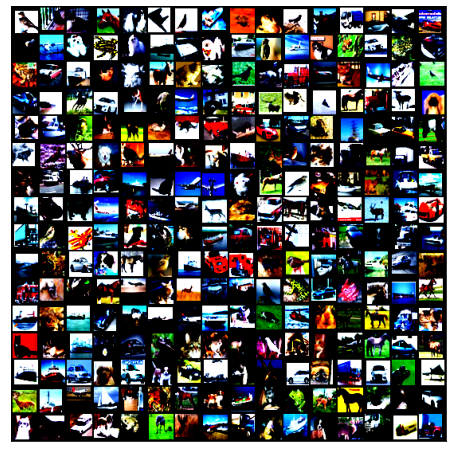

In [9]:
#visualise sample of dataset
def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(16, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=16).permute(1, 2, 0))
        break

show_batch(train_dl) 

In [10]:
#add sample data images to tensorboard 

examples = iter(test_dl)
examples_data, example_targets = examples.next()

#adds image sample in tensorboard
img_grid = torchvision.utils.make_grid(examples_data)
writer.add_image('sample images', img_grid)

### VGG 19 model

In [11]:
#create VGG model class

#architecture to be passed to layer creation method
#M is for maxpooling
#vgg 19 architecture (19 layers)
VGG19 = [64, 64, "M", 128, 128, "M", 256, 256, 256, 256, "M", 512, 512, 512, 512, "M", 512, 512, 512, 512, "M"]


#class to create VGG model arcitecture

class VGG_net(nn.Module):
    def __init__(self, in_channels=3, num_classes=10):
        super(VGG_net, self).__init__()
        self.in_channels = in_channels
        self.conv_layers = self.create_conv_layers(VGG19) #calls layer creation function and returns a sequential model (passed list with architecture)
        #create fully connected layers after implemeting relevant VGG architecture
        self.fcl = nn.Sequential(
            nn.Linear(512, 512), 
            nn.ReLU(), 
            nn.Dropout(p=0.5), 
            nn.Linear(512, 512), 
            nn.ReLU(), 
            nn.Dropout(p=0.5), 
            nn.Linear(512, num_classes)
            )


    def forward(self, x):
        x = self.conv_layers(x)
        x = x.reshape(x.shape[0], -1) #flatten
        x = self.fcl(x) #pass through fully connected layers
        return x

    def create_conv_layers(self, architecture):
        layers = [] #empty list to hold layers
        in_channels = self.in_channels 

        for x in architecture:
            if type(x) == int:
                #create conv layer
                out_channels = x

                layers += [nn.Conv2d(in_channels=in_channels, out_channels=out_channels, 
                kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.BatchNorm2d(x), nn.ReLU()]
                in_channels = x #create new in_channels for next layer from the out_channels of the previous layer
            
            elif x == "M":
                #create maxpool layer
                layers += [nn.MaxPool2d(kernel_size=(2,2), stride=(2,2))]

        return nn.Sequential(*layers) #unpacks the list and returns a sequential model

  

In [12]:
#VGG 19 Set up

#create instence of VGG
vgg_net = VGG_net()

#learning rate
my_lr = 0.1
#weight decay
my_weight_decay = 1e-4
#optimizer - VGG
optimizer = torch.optim.SGD( vgg_net.parameters() , lr=my_lr, weight_decay=1e-4)

#scheduler - VGG
scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100, 150], gamma = 0.1)

#generate model diagram of VGG on tensorboard (Run CNN set up to see CNN diagram on tensorboard)

writer.add_graph(vgg_net, examples_data)
writer.close()

#set up gpu
#check for gpu
def get_default_device():
  return torch.device("cuda") if torch.cuda.is_available else torch.device("cpu")

#set gpu as training device  
device = get_default_device()
print(device)  

cuda


In [13]:
#training loop

#set number of epoch
EPOCHS = 200

#send network obj to GPU

vgg_net.to(device)

#print start time
now = time.ctime()
print(f'Training start: {now}')

#Run training 
for epoch in range(EPOCHS):



  #create criterion
  criterion = nn.CrossEntropyLoss()

# set to train mode
  vgg_net.train()

#step optimizer 

  optimizer.step()
  
  #step scheduler - decay on epoch 100 and 150 
  scheduler.step()
  
  losses = []
  running_loss = 0

  #save model on every 5th epoch
  if epoch %5 == 0:
    #Set dir path
    PATH = './training_saves/VGG'

    #check dir exists
    if not os.path.exists(PATH):
      os.makedirs(PATH)

    #create file name
    filename = os.path.join(PATH, 'Model_vgg_checkpoint_' + str(epoch) + '.th')

    #save state
    torch.save(vgg_net.state_dict(), filename)

### TensorBoard output variables
  running_loss = 0.0
  running_correct = 0


  for i, inp in enumerate(train_dl):
        inputs, labels = inp
        inputs, labels = inputs.to('cuda'), labels.to('cuda')
        optimizer.zero_grad()
    
        outputs = vgg_net(inputs)
        loss = criterion(outputs, labels)
        losses.append(loss.item())

        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

        #TB - Running correct
        _, predicted = torch.max(outputs.data, 1)
        running_correct += (predicted == labels).sum().item()

        
        if epoch%5 == 0 and i ==195:
          ##### NOTE OUTPUT ONLY DISPLAYS ON EVERY 5TH EPOCH ######
            print(f'Training: [Epoch: {epoch}]    [Batch: {i}]    [Loss: {running_loss / 100}]')
            
            #generate curve and add to TB output
            writer.add_scalar('VGG19 - Training loss', running_loss / 5, epoch * len(train_dl) + i)
            writer.add_scalar('VGG19 - Accuracy', running_correct / 5, epoch * len(train_dl) + i)
            
            #reset loss and correct variables for next iteraion
            running_loss = 0.0
            running_correct = 0



now = time.ctime()         
print(f'Training Finish at: {now}')

#output didnt have the updated call to c.time training ended at 5:20:06

Training start: Tue Nov 22 03:45:23 2022
Training: [Epoch: 0]    [Batch: 195]    [Loss: 3.4657506155967712]
Training: [Epoch: 5]    [Batch: 195]    [Loss: 1.2579286032915116]
Training: [Epoch: 10]    [Batch: 195]    [Loss: 0.8361285796761513]
Training: [Epoch: 15]    [Batch: 195]    [Loss: 0.6179943998157978]
Training: [Epoch: 20]    [Batch: 195]    [Loss: 0.46677068673074246]
Training: [Epoch: 25]    [Batch: 195]    [Loss: 0.3857829045504332]
Training: [Epoch: 30]    [Batch: 195]    [Loss: 0.30124971926212313]
Training: [Epoch: 35]    [Batch: 195]    [Loss: 0.22747753135859966]
Training: [Epoch: 40]    [Batch: 195]    [Loss: 0.19159511797130108]
Training: [Epoch: 45]    [Batch: 195]    [Loss: 0.1715469745360315]
Training: [Epoch: 50]    [Batch: 195]    [Loss: 0.13720004174858333]
Training: [Epoch: 55]    [Batch: 195]    [Loss: 0.12398107072338461]
Training: [Epoch: 60]    [Batch: 195]    [Loss: 0.10423516693525016]
Training: [Epoch: 65]    [Batch: 195]    [Loss: 0.09619850499555468]
T

Training start: Tue Nov 22 03:45:23 2022

Training: [Epoch: 0]    [Batch: 195]    [Loss: 3.4657506155967712]

Training: [Epoch: 5]    [Batch: 195]    [Loss: 1.2579286032915116]

Training: [Epoch: 10]    [Batch: 195]    [Loss: 0.8361285796761513]

Training: [Epoch: 15]    [Batch: 195]    [Loss: 0.6179943998157978]

Training: [Epoch: 20]    [Batch: 195]    [Loss: 0.46677068673074246]

Training: [Epoch: 25]    [Batch: 195]    [Loss: 0.3857829045504332]

Training: [Epoch: 30]    [Batch: 195]    [Loss: 0.30124971926212313]

Training: [Epoch: 35]    [Batch: 195]    [Loss: 0.22747753135859966]

Training: [Epoch: 40]    [Batch: 195]    [Loss: 0.19159511797130108]

Training: [Epoch: 45]    [Batch: 195]    [Loss: 0.1715469745360315]

Training: [Epoch: 50]    [Batch: 195]    [Loss: 0.13720004174858333]

Training: [Epoch: 55]    [Batch: 195]    [Loss: 0.12398107072338461]

Training: [Epoch: 60]    [Batch: 195]    [Loss: 0.10423516693525016]

Training: [Epoch: 65]    [Batch: 195]    [Loss: 0.09619850499555468]

Training: [Epoch: 70]    [Batch: 195]    [Loss: 0.08794688260182738]

Training: [Epoch: 75]    [Batch: 195]    [Loss: 0.0799271558271721]

Training: [Epoch: 80]    [Batch: 195]    [Loss: 0.07533206118736416]

Training: [Epoch: 85]    [Batch: 195]    [Loss: 0.056527122561819854]

Training: [Epoch: 90]    [Batch: 195]    [Loss: 0.05492712645791471]

Training: [Epoch: 95]    [Batch: 195]    [Loss: 0.06843137994874268]

Training: [Epoch: 100]    [Batch: 195]    [Loss: 0.016902708346606232]

Training: [Epoch: 105]    [Batch: 195]    [Loss: 0.00695683293917682]

Training: [Epoch: 110]    [Batch: 195]    [Loss: 0.005612355950288475]

Training: [Epoch: 115]    [Batch: 195]    [Loss: 0.004311882500478532]

Training: [Epoch: 120]    [Batch: 195]    [Loss: 0.003692198795833974]

Training: [Epoch: 125]    [Batch: 195]    [Loss: 0.0033593364147964165]

Training: [Epoch: 130]    [Batch: 195]    [Loss: 0.0026235908178932734]

Training: [Epoch: 135]    [Batch: 195]    [Loss: 0.0024573584575773564]

Training: [Epoch: 140]    [Batch: 195]    [Loss: 0.0024894655432581205]

Training: [Epoch: 145]    [Batch: 195]    [Loss: 0.0023970455810194834]

Training: [Epoch: 150]    [Batch: 195]    [Loss: 0.0019376127147916122]

Training: [Epoch: 155]    [Batch: 195]    [Loss: 0.0016562418822286418]

Training: [Epoch: 160]    [Batch: 195]    [Loss: 0.0014994219909931416]

Training: [Epoch: 165]    [Batch: 195]    [Loss: 0.0016291615704176366]

Training: [Epoch: 170]    [Batch: 195]    [Loss: 0.0011979192297440022]

Training: [Epoch: 175]    [Batch: 195]    [Loss: 0.0015419468738036813]

Training: [Epoch: 180]    [Batch: 195]    [Loss: 0.0024630688694742275]

Training: [Epoch: 185]    [Batch: 195]    [Loss: 0.0015544296143343672]

Training: [Epoch: 190]    [Batch: 195]    [Loss: 0.0014171997524317704]

Training: [Epoch: 195]    [Batch: 195]    [Loss: 0.0017378953910883864]

Training Finish at: Tue Nov 22 05:20:06 2022

In [14]:
#test VGG model

with torch.no_grad():
  total = 0
  correct = 0
  for data in test_dl:
        vgg_net.eval()
        images, labels = data
        images, labels = images.to('cuda'), labels.to('cuda')
        outputs = vgg_net(images)
        
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
print(f'[VGG - Accuracy on test images: {100*(correct/total)}] \n [Total Correct: {correct}] \n [Total Tested: {total}]')

[VGG - Accuracy on test images: 92.51] 
 [Total Correct: 9251] 
 [Total Tested: 10000]


[VGG - Accuracy on test images: 92.51] 
 
 [Total Correct: 9251] 
 
 [Total Tested: 10000]

### BASIC CNN MODEL AS BENCHMARK METHOD

In [15]:
#Basic CNN cossting of 3 converlution layers each withn their own pooling layer
#and 2 fully connected layers prior to output


class CNN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.model = torch.nn.Sequential(
            #convlution layer 1
            torch.nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, padding = 1), 
            torch.nn.ReLU(),
            #pooling layer
            torch.nn.MaxPool2d(kernel_size=2),
  
            #convlution layer 2
            torch.nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, padding = 1),
            torch.nn.ReLU(),
            #pooling layer
            torch.nn.MaxPool2d(kernel_size=2),

            #convlution layer 3  
            torch.nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, padding = 1),
            torch.nn.ReLU(),
            
            #pooling layer
            torch.nn.MaxPool2d(kernel_size=2),
  
            #flatten to one-dimensional tensor
            torch.nn.Flatten(),

            #fully connected layer
            torch.nn.Linear(64*4*4, 512),
            torch.nn.ReLU(),

            #output layer
            torch.nn.Linear(512, 10)
        )
  
    def forward(self, x):
        return self.model(x)


In [16]:
#CNN SETUP

#create instence of basic CNN
CNN_net = CNN()

#learning rate
my_lr = 0.1
#weight decay
my_weight_decay = 1e-4

#optimizer - CNN
optimizer=torch.optim.SGD(CNN_net.parameters() , lr=my_lr, weight_decay=my_weight_decay)

#create scheduler to decay LR on epoch 100 and 150
scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100, 150], gamma = 0.1)


#generate model diagram of CNN on tensorboard (Run VGG set up to see VGG diagram on tensorboard)

writer.add_graph(CNN_net, examples_data)
writer.close()

#set up gpu
#check for gpu
def get_default_device():
  return torch.device("cuda") if torch.cuda.is_available else torch.device("cpu")

#set training device as gpu  
device = get_default_device()
print(device)  

cuda


In [18]:
#set training loop
#set number of epoch
EPOCHS = 200

#send network obj to GPU

CNN_net.to(device)

#print start time
now = time.ctime()
print(f'Training start: {now}')

#train
for epoch in range(EPOCHS):
  #create criterion
  criterion = nn.CrossEntropyLoss()

# set to train mode
  CNN_net.train()

  #step optimizer
  optimizer.step()
  #step scheduler - will decay LR on epoch 100 and 150
  scheduler.step()

  losses = []
  running_loss = 0

  #save model on every 5th epoch
  if epoch %5 == 0:
    #Set dir path
    PATH = './training_saves/CNN'

    #check dir exists
    if not os.path.exists(PATH):
      os.makedirs(PATH)

    #create file name
    filename = os.path.join(PATH, 'Model_CNN_checkpoint_' + str(epoch) + '.th')

    #save State
    torch.save(CNN_net.state_dict(), filename)

    ### TensorBoard output variables
  running_loss = 0.0
  running_correct = 0

  for i, inp in enumerate(train_dl):
        inputs, labels = inp
        inputs, labels = inputs.to('cuda'), labels.to('cuda')
        optimizer.zero_grad()
    
        outputs = CNN_net(inputs)
        loss = criterion(outputs, labels)
        losses.append(loss.item())

        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

         #TB - Running correct
        _, predicted = torch.max(outputs.data, 1)
        running_correct += (predicted == labels).sum().item()
        
        if epoch%5 == 0 and i ==195:
          ##### NOTE OUTPUT ONLY DISPLAYS ON EVERY 5TH EPOCH ######
            print(f'Training: [Epoch: {epoch}]    [Batch: {i}]    [Loss: {running_loss / 100}]')
 
            #generate curve and add to TB output
            writer.add_scalar('CNN - Training loss', running_loss / 5, epoch * len(train_dl) + i)
            writer.add_scalar('CNN - Accuracy', running_correct / 5, epoch * len(train_dl) + i)
            
            #reset loss and correct variables for next iteraion
            running_loss = 0.0
            running_correct = 0 

now = time.ctime()
print(f'Training Finish at: {now}')

Training start: Tue Nov 22 05:28:18 2022
Training: [Epoch: 0]    [Batch: 195]    [Loss: 1.3754606992006302]
Training: [Epoch: 5]    [Batch: 195]    [Loss: 1.2281655460596084]
Training: [Epoch: 10]    [Batch: 195]    [Loss: 1.0995424216985703]
Training: [Epoch: 15]    [Batch: 195]    [Loss: 1.0048823016881943]
Training: [Epoch: 20]    [Batch: 195]    [Loss: 0.9737844651937485]
Training: [Epoch: 25]    [Batch: 195]    [Loss: 0.9074070912599563]
Training: [Epoch: 30]    [Batch: 195]    [Loss: 0.8050789415836335]
Training: [Epoch: 35]    [Batch: 195]    [Loss: 0.7694327341020107]
Training: [Epoch: 40]    [Batch: 195]    [Loss: 0.7541119848191739]
Training: [Epoch: 45]    [Batch: 195]    [Loss: 0.6954854211211204]
Training: [Epoch: 50]    [Batch: 195]    [Loss: 0.645259447991848]
Training: [Epoch: 55]    [Batch: 195]    [Loss: 0.5969084827601909]
Training: [Epoch: 60]    [Batch: 195]    [Loss: 0.5876052546501159]
Training: [Epoch: 65]    [Batch: 195]    [Loss: 0.5578449289500713]
Training: 

Training start: Tue Nov 22 05:28:18 2022

Training: [Epoch: 0]    [Batch: 195]    [Loss: 1.3754606992006302]

Training: [Epoch: 5]    [Batch: 195]    [Loss: 1.2281655460596084]

Training: [Epoch: 10]    [Batch: 195]    [Loss: 1.0995424216985703]

Training: [Epoch: 15]    [Batch: 195]    [Loss: 1.0048823016881943]

Training: [Epoch: 20]    [Batch: 195]    [Loss: 0.9737844651937485]

Training: [Epoch: 25]    [Batch: 195]    [Loss: 0.9074070912599563]

Training: [Epoch: 30]    [Batch: 195]    [Loss: 0.8050789415836335]

Training: [Epoch: 35]    [Batch: 195]    [Loss: 0.7694327341020107]

Training: [Epoch: 40]    [Batch: 195]    [Loss: 0.7541119848191739]

Training: [Epoch: 45]    [Batch: 195]    [Loss: 0.6954854211211204]

Training: [Epoch: 50]    [Batch: 195]    [Loss: 0.645259447991848]

Training: [Epoch: 55]    [Batch: 195]    [Loss: 0.5969084827601909]

Training: [Epoch: 60]    [Batch: 195]    [Loss: 0.5876052546501159]

Training: [Epoch: 65]    [Batch: 195]    [Loss: 0.5578449289500713]

Training: [Epoch: 70]    [Batch: 195]    [Loss: 0.5125131845474243]

Training: [Epoch: 75]    [Batch: 195]    [Loss: 0.4964734290540218]

Training: [Epoch: 80]    [Batch: 195]    [Loss: 0.3488889926671982]

Training: [Epoch: 85]    [Batch: 195]    [Loss: 0.32224244236946104]

Training: [Epoch: 90]    [Batch: 195]    [Loss: 0.3100768860429525]

Training: [Epoch: 95]    [Batch: 195]    [Loss: 0.29629236258566377]

Training: [Epoch: 100]    [Batch: 195]    [Loss: 0.2794968297332525]

Training: [Epoch: 105]    [Batch: 195]    [Loss: 0.2831450547277927]

Training: [Epoch: 110]    [Batch: 195]    [Loss: 0.2807021028548479]

Training: [Epoch: 115]    [Batch: 195]    [Loss: 0.2676374375075102]

Training: [Epoch: 120]    [Batch: 195]    [Loss: 0.26195338010787966]

Training: [Epoch: 125]    [Batch: 195]    [Loss: 0.25351855989545585]

Training: [Epoch: 130]    [Batch: 195]    [Loss: 0.24294211819767952]

Training: [Epoch: 135]    [Batch: 195]    [Loss: 0.24225330792367458]

Training: [Epoch: 140]    [Batch: 195]    [Loss: 0.244690368026495]

Training: [Epoch: 145]    [Batch: 195]    [Loss: 0.24540040101855992]

Training: [Epoch: 150]    [Batch: 195]    [Loss: 0.24141686275601387]

Training: [Epoch: 155]    [Batch: 195]    [Loss: 0.23743776295334101]

Training: [Epoch: 160]    [Batch: 195]    [Loss: 0.23995577257126569]

Training: [Epoch: 165]    [Batch: 195]    [Loss: 0.2379627750068903]

Training: [Epoch: 170]    [Batch: 195]    [Loss: 0.2370977733284235]

Training: [Epoch: 175]    [Batch: 195]    [Loss: 0.24195508703589438]

Training: [Epoch: 180]    [Batch: 195]    [Loss: 0.2350991177558899]

Training: [Epoch: 185]    [Batch: 195]    [Loss: 0.23414141729474067]

Training: [Epoch: 190]    [Batch: 195]    [Loss: 0.23476541578769683]

Training: [Epoch: 195]    [Batch: 195]    [Loss: 0.23640444103628397]

Training Finish at: Tue Nov 22 06:05:07 2022

In [20]:
#test Vanilla CNN model

with torch.no_grad():
  total = 0
  correct = 0
  for data in test_dl:
        CNN_net.eval()
        images, labels = data
        images, labels = images.to('cuda'), labels.to('cuda')
        outputs = CNN_net(images)
        
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()


print(f'[CNN - Accuracy on test images: {100*(correct/total)} %] \n [Total Correct: {correct}] \n [Total Tested: {total}]')


[CNN - Accuracy on test images: 83.72 %] 
 [Total Correct: 8372] 
 [Total Tested: 10000]


In [21]:
#get number of parameters 

def count_parameters(model):
  return sum(p.numel() for p in model.parameters() if p.requires_grad)


#VGG
count_vgg = count_parameters(vgg_net)

#CNN
count_cnn = count_parameters(CNN_net)


print(f'VGG19 -  Parameters: {count_vgg}')#20,565,834

print(f'CNN - Parameters: {count_cnn}')##586,250



VGG19 -  Parameters: 20565834
CNN - Parameters: 586250


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  after removing the cwd from sys.path.
